# Coverage Correlation

In [1]:
import ribopy
import numpy as np
import pandas as pd
import math

import warnings
import scipy
import scipy.stats as stats
import scipy.stats as st
import matplotlib

import ribopy
from ribopy.core.get_gadgets import get_region_boundaries
import h5py

from collections import OrderedDict

from IPython.display import display_html

In [2]:
# Import the manuscript colors
import sys

sys.path.append('..')
from manuscript_colors import *

In [3]:
LENGTH_MIN  = 28
LENGTH_MAX  = 35

FIGURE_RESOLUTION = 600
COVERAGE_THRESHOLD = 1

In [4]:
psite_offsets = { 28 : 12, 29:12, 30:12, 31:12,
                   32: 13, 33: 13, 34:13, 35: 13 }

In [5]:
%matplotlib inline
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [20, 6]

In [6]:
#ribo_path = "../07_19_2020_with_umi_dedup_for_ribo_but_no_dedup_for_rnaseq.ribo"
ribo_path = "../all.ribo"

def rename(x):
    return x.split("|")[4]

myribo = ribopy.Ribo(ribo_path, alias=rename)

In [7]:
myribo.print_info()

Ribo File Info:
---------------
Ribo File Version : 1.0
RiboPy Version    : 0.0.0
Creation Time     : 2020-07-20 23:53:05
Reference         : appris-v1
Min Read Length   : 15
Max Read Length   : 40
Metagene Radius   : 50
Left Span         : 35
Right Span        : 10

Experiments:
------------ 
Name                         Reads  Coverage  RNA-Seq  Metadata
20200618-NSP1-HEK-1        7075270         *        *          
20200618-NSP1-HEK-2        7954234         *        *          
20200618-NSP1-HEK-3        8631477         *        *          
20200618-NSP2-HEK-1        7319954         *        *          
20200618-NSP2-HEK-2       13871717         *        *          
20200618-NSP2-HEK-3        7436286         *        *          
20200717-NSP1-HEK-1-setB  12503413         *        *          
20200717-NSP1-HEK-2-setB  10390514         *        *          
20200717-NSP1-HEK-3-setB  16772718         *        *          
20200717-NSP2-HEK-1-setB  17989686         *        *          
2

In [8]:
NSP1_experiments = ["20200717-NSP1-HEK-1-setB", "20200717-NSP1-HEK-2-setB", "20200717-NSP1-HEK-3-setB"]
NSP2_experiments = ["20200717-NSP2-HEK-1-setB", "20200717-NSP2-HEK-2-setB", "20200717-NSP2-HEK-3-setB"]
WT_experiments   = ["20200717-WT-HEK-1-setB",   "20200717-WT-HEK-2-setB",  "20200717-WT-HEK-3-setB"]
EXPERIMENT_SET   = NSP1_experiments + NSP2_experiments + WT_experiments

## Length Distribution

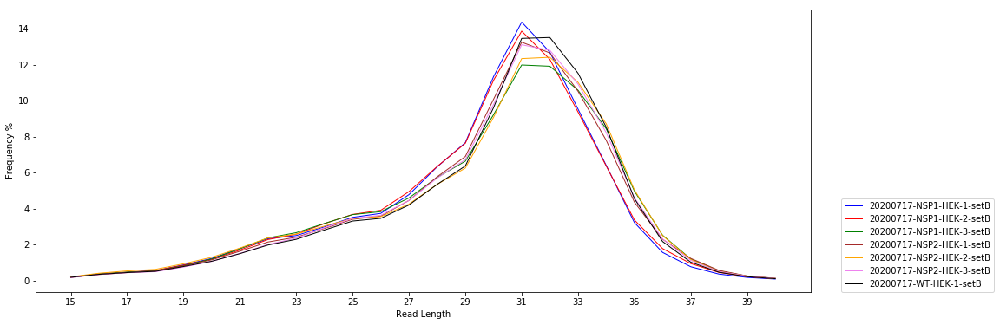

In [9]:
myribo.plot_lengthdist(region_type = "CDS", 
                       experiments = EXPERIMENT_SET[:7], 
                       normalize   = True
                      )

## Reading Coverage Data

In [10]:
def adjust_p_site_of_experiment(coverage_dict, offset):
    """
    coverage_dict is of the form
       transcript_name => coverage_vector
       
    offset is the number of nucleotides the coverage vector needs to be moved to the rigth
    
    """
    
    patch_vector = [0 for i in range(offset)]
    
    adjusted_coverage = dict()
    
    for transcript, coverage in coverage_dict.items():
        # append zeros to the elft end
        # remove equal numer of elements from the right end
        adjusted_coverage[transcript] = \
            np.concatenate(
                (patch_vector , coverage[: (-1)*offset ]) )
        
    return adjusted_coverage
        
        

def get_p_adjusted_coverage_dict(ribo, experiment, 
                                 range_lower, range_upper, 
                                 p_adj_offsets, 
                                 alias = True):
    
    tmp_dict = ribo.get_coverage(experiment  = experiment,
                                  range_lower = range_lower, 
                                  range_upper = range_lower,
                                  alias       = alias)
    
    coverage_dict = \
            adjust_p_site_of_experiment(\
                tmp_dict, p_adj_offsets[range_lower])
    
    # skip the first range as it is already taken care of
    for i in range(range_lower + 1, range_upper + 1):
        tmp_dict = ribo.get_coverage(experiment  = experiment,
                                     range_lower = i, 
                                     range_upper = i,
                                     alias       = alias)
        
        tmp_dict = adjust_p_site_of_experiment(
                            tmp_dict, 
                            p_adj_offsets[i])
        
        # Add the coverage values for each gene
        for gene in tmp_dict.keys():
            coverage_dict[gene] = \
                np.add( tmp_dict[gene], coverage_dict[gene] )
        
    
    return coverage_dict


##############################################################################################

def get_coverage(ribo, 
                 experiment,
                 range_lower   = 0,
                 range_upper   = 0,
                 alias         = False,
                 multiplier    = 1,
                 p_adj_offsets = None):
    """
    NOTETHAT THIS FUNCTION RETURNS A TUPLE!!!
    
    p_adjusted_offsets is a dictionary of the form
        read_length -> offset
    
    coverage_dict: This is the output of the function "get_coverage"
    of the ribo object.
    
    Returns a pair: (dataframe, coverage_dict)
    
    The coverage dictionary has the nucleotide coveraage of all the 
    transcripts
    
    In the dataframe, the last column 
    has the coverage density of a given transcript.
    The normalized covarage is defined by
       (#total_reads / #transcript_length) * 1000000
       
    """
    
    if p_adj_offsets:
        coverage_dict = get_p_adjusted_coverage_dict(
                             ribo          = ribo, 
                             experiment    = experiment, 
                             range_lower   = range_lower, 
                             range_upper   = range_upper, 
                             p_adj_offsets = p_adj_offsets, 
                             alias         = alias)
    else:    
        coverage_dict = ribo.get_coverage(experiment  = experiment,
                                          range_lower = range_lower, 
                                          range_upper = range_upper,
                                          alias       = alias)
    
    region_boundaries = get_region_boundaries(ribo._handle)
    
    transcript_names     = coverage_dict.keys()
    transcript_coverages = coverage_dict.values()
    transcript_total     = tuple( map( np.sum, transcript_coverages ) )
    transcript_lengths   = tuple( map(len, transcript_coverages) )
    normalized_coverage  = np.divide(transcript_total , transcript_lengths) * multiplier
    start_sites          = tuple( map( lambda x: x[1][0], region_boundaries ) )
    stop_sites           = tuple( map( lambda x: x[1][1], region_boundaries ) )
    
    # We also add normalized cds coverage
    cds_data = zip( start_sites, stop_sites, transcript_coverages )
    norm_cds = tuple( map( lambda x:  
                              (np.sum( x[2][x[0]:x[1]] ) / (x[1] - x[0]) )* multiplier,
                      cds_data) )
    
    result = pd.DataFrame(data = { "total"     :  transcript_total, 
                                   "length"    :  transcript_lengths,
                                   "cds_start" :  start_sites,
                                   "cds_stop"  :  stop_sites,
                                   "norm_cds"  :  norm_cds,
                                   "norm_cov"  :  normalized_coverage}, 
                          index = transcript_names) 
    
    return( (result, coverage_dict))

In [11]:
# Definitions
coverage_min_length = 28
coverage_max_length = 35
this_alias          = rename

# experiment -> (coverage_df, nucleotide coverage)
# where nucleodite coverage is a dictionary of the form
#       transcript -> coverage vector
coverages = { e: get_coverage(
                     ribo          = myribo, 
                     experiment    = e,
                     range_lower   = coverage_min_length,
                     range_upper   = coverage_max_length,
                     alias         = rename,
                     p_adj_offsets = psite_offsets)\
                 for e in myribo.experiments}

## Sufficiently  Covered Gene Selection

For an individual experiment, a gene is sufficiently covered if the following holds. 
The sum of the reads at the coding sequence of the region 
divided by the length of the coding sequence is one or larger. 
In other words, each nucleotide position has one or more reads, on average, on the coding sequence.

Using the above difintion, first we determine the sufficiently covered genes for each experiment. 
Than, for each experiment group, we take the intersection of the sufficiently covered genes. 
For example, for the group NSP1, we intersect the three gene sets comve from the three replicates. 
After finding the intersections for the groups NSP1, NSP2 and WT, we take the unions of these sets. 
We use this union set for our downstream analysis coming from the coverage of CDS. 
Such analyses include pause sites and correlation.

In [12]:
# Here we find the sufficiently covered genes 
# that we'll be using in the rest of the analysis

NSP1_sets = dict()

for e in NSP1_experiments:
    NSP1_sets[e] = set( coverages[e][0][ (coverages[e][0].norm_cds>=COVERAGE_THRESHOLD ) ].index)

NSP1_intersection = NSP1_sets["20200717-NSP1-HEK-1-setB"].\
                       intersection(NSP1_sets["20200717-NSP1-HEK-2-setB"], 
                                    NSP1_sets["20200717-NSP1-HEK-3-setB"])

####################################################################################

NSP2_sets = dict()

for e in NSP2_experiments:
    NSP2_sets[e] = set( coverages[e][0][ (coverages[e][0].norm_cds>=COVERAGE_THRESHOLD ) ].index)

NSP2_intersection = NSP2_sets["20200717-NSP2-HEK-1-setB"].\
                      intersection(NSP2_sets["20200717-NSP2-HEK-2-setB"], 
                                   NSP2_sets["20200717-NSP2-HEK-3-setB"])

####################################################################################
    
WT_sets = dict()

for e in WT_experiments:
    WT_sets[e] = set( coverages[e][0][ (coverages[e][0].norm_cds>=COVERAGE_THRESHOLD ) ].index)
    
WT_intersection = WT_sets[WT_experiments[0]].\
                      intersection( WT_sets[WT_experiments[1]], 
                                   WT_sets[WT_experiments[2]] )

######################################################################################

selected_genes = tuple(NSP1_intersection.union(NSP2_intersection, WT_intersection) )
print("There are {} selected genes.".format(len(selected_genes)))

There are 1501 selected genes.


## Correlation Analysis

In [13]:
spearman_correlations = dict()
pearson_correlations  = dict()

In [14]:
myribo.print_info()

Ribo File Info:
---------------
Ribo File Version : 1.0
RiboPy Version    : 0.0.0
Creation Time     : 2020-07-20 23:53:05
Reference         : appris-v1
Min Read Length   : 15
Max Read Length   : 40
Metagene Radius   : 50
Left Span         : 35
Right Span        : 10

Experiments:
------------ 
Name                         Reads  Coverage  RNA-Seq  Metadata
20200618-NSP1-HEK-1        7075270         *        *          
20200618-NSP1-HEK-2        7954234         *        *          
20200618-NSP1-HEK-3        8631477         *        *          
20200618-NSP2-HEK-1        7319954         *        *          
20200618-NSP2-HEK-2       13871717         *        *          
20200618-NSP2-HEK-3        7436286         *        *          
20200717-NSP1-HEK-1-setB  12503413         *        *          
20200717-NSP1-HEK-2-setB  10390514         *        *          
20200717-NSP1-HEK-3-setB  16772718         *        *          
20200717-NSP2-HEK-1-setB  17989686         *        *          
2

In [15]:
NSP1_pairs = (\
    ('20200717-NSP1-HEK-1-setB', '20200717-NSP1-HEK-2-setB'), 
    ('20200717-NSP1-HEK-1-setB', '20200717-NSP1-HEK-3-setB'), 
    ('20200717-NSP1-HEK-2-setB', '20200717-NSP1-HEK-3-setB')
) 

NSP2_pairs = (\
    ('20200717-NSP2-HEK-1-setB', '20200717-NSP2-HEK-2-setB'), 
    ('20200717-NSP2-HEK-1-setB', '20200717-NSP2-HEK-3-setB'), 
    ('20200717-NSP2-HEK-2-setB', '20200717-NSP2-HEK-3-setB')
)

WT_pairs = (\
    ('20200717-WT-HEK-1-setB', '20200717-WT-HEK-2-setB'),
    ('20200717-WT-HEK-1-setB', '20200717-WT-HEK-3-setB'),
    ('20200717-WT-HEK-2-setB', '20200717-WT-HEK-3-setB'),
)

In [16]:
def get_correlations(coverages, pairs,
                     genes,
                     correlation_type = "pearson"):
    
    assert correlation_type in ["pearson", "spearman"]
    
    if correlation_type == "pearson":
        correlation_function = stats.pearsonr
    else:
        correlation_function = stats.spearmanr
        
    correlations = dict()
    
    for p in pairs:
        this_pair_label = "_".join(p)
        correlations[this_pair_label] = dict()
        
        for g in genes:
            
            cds_start = coverages[p[0]][0].loc[g, "cds_start"]
            cds_stop  = coverages[p[0]][0].loc[g, "cds_stop"]
            
            coverage_1 = np.log2( np.add( coverages[p[0]][1][g][cds_start:cds_stop] , 1/4 ) )
            coverage_2 = np.log2( np.add( coverages[p[1]][1][g][cds_start:cds_stop] , 1/4 ) )
    
            correlations[this_pair_label][g] = correlation_function(coverage_1, coverage_2)[0]
        
    return correlations

def plot_correlation_histograms( coverages, pairs, correlations,
                                 xmin, ymax, colors,
                                 yticks           = (0, 100, 200) ,
                                 number_of_bins   = 30, 
                                 bin_width        = 0.01):
    
    this_pair_label = "_".join(pairs[0])
    histogram, bins = \
            np.histogram(tuple(correlations[this_pair_label].values() ), 
                               bins   = number_of_bins,
                               density = False )
    
    mid_index     = math.floor(len(pairs) / 2)

    x_coordinates = 0.5 * (bins[1:] + bins[:-1]) - (mid_index * bin_width)
    
    plt.xlim(xmin, 1)
    plt.ylim(0   , ymax)
    
    plt.bar(x_coordinates, histogram, width = bin_width , color = colors[0]);
    
    plt.ylabel("Frequency")
    plt.yticks(yticks, yticks)
    
    for i in range(1,len(pairs)):
        this_pair_label = "_".join(pairs[i])
        
        if i == mid_index:
            raw_xticks = x_coordinates
            
        x_coordinates += bin_width
        
        histogram, bins = \
            np.histogram(tuple(correlations[this_pair_label].values() ), 
                               bins   = number_of_bins,
                               density = False )
        
        plt.bar(x_coordinates, histogram, width = bin_width, color = colors[i]);
        
    formatted_x_ticks = tuple( map( lambda x: "{:.2f}".format(x) , raw_xticks) )
    plt.xticks( raw_xticks, formatted_x_ticks )

###########################################################################################

def plot_correlation_histograms( coverages, pairs, correlations,
                                 xmin, ymax, colors,
                                 bin_edges        ,
                                 yticks           = (0, 100, 200, 300) , 
                                 bin_width        = 0.01):
    
    this_pair_label = "_".join(pairs[0])
    histogram, bins = \
            np.histogram(tuple(correlations[this_pair_label].values() ), 
                               bins   = bin_edges,
                               density = False )
    
    mid_index     = math.floor(len(pairs) / 2)

    bin_edges     = np.array(bin_edges)
    bin_centers   = 0.5 * (bin_edges[1:] + bin_edges[:-1]) 
    x_coordinates = bin_centers - (mid_index * bin_width)
    
    plt.xlim(xmin, 1)
    plt.ylim(0   , ymax)
    
    plt.bar(x_coordinates, histogram, width = bin_width , color = colors[0]);
    
    plt.ylabel("Frequency")
    plt.yticks(yticks, yticks)
    
    for i in range(1,len(pairs)):
        this_pair_label = "_".join(pairs[i])
            
        x_coordinates += bin_width
        
        histogram, bins = \
            np.histogram(tuple(correlations[this_pair_label].values() ), 
                               bins   = bin_edges,
                               density = False )
        
        plt.bar(x_coordinates, histogram, width = bin_width, color = colors[i]);
        
    formatted_x_ticks = tuple( map( lambda x: "{:.2f}".format(x) , bin_centers) )
    plt.xticks( bin_centers, formatted_x_ticks )


In [17]:
experiment_groups = [("NSP1", NSP1_pairs), 
                     ("NSP2", NSP2_pairs),
                     ("WT", WT_pairs)]

In [18]:
for exp_group, pairs in experiment_groups:
    pearson_correlations[exp_group] = \
        get_correlations(
                     coverages        = coverages, 
                     pairs            = pairs,
                     genes            = selected_genes,
                     correlation_type = "pearson")

In [19]:

number_of_bins  = 15
bin_center_max  = np.float32(0.98)
# bin_width       = np.float32(0.008)
bin_width       = np.float32(0.01)
# half_width      = np.float32(0.004)
half_width      = np.float32(0.005)
separation_bins = np.float32(4)
half_seperation = separation_bins / 2
step_size       = np.float32(bin_width) * np.float32(separation_bins)

bin_centers   = [ bin_center_max - i*step_size for i in range(number_of_bins) ]
bin_intervals = [ (x - half_width, x + half_width ) for x in bin_centers]
bin_intervals


bin_center_min = 0.39499999910593035
bin_centers      = [ bin_center_min + i*step_size for i in range(number_of_bins) ]
#bin_edges.append(bin_edges[-1] + bin_width)
bin_edges  = [bin_center_min - half_seperation * bin_width ] +\
             [ bin_center_min + half_seperation * bin_width + separation_bins*bin_width* i for i in range(number_of_bins) ]

bin_edges

[0.3749999995529652,
 0.41499999865889553,
 0.45499999776482586,
 0.4949999968707562,
 0.5349999959766865,
 0.5749999950826168,
 0.6149999941885471,
 0.6549999932944774,
 0.6949999924004078,
 0.7349999915063381,
 0.7749999906122684,
 0.8149999897181988,
 0.8549999888241291,
 0.8949999879300594,
 0.9349999870359897,
 0.9749999861419201]

In [20]:
bin_centers

[0.39499999910593037,
 0.4349999982118607,
 0.474999997317791,
 0.5149999964237213,
 0.5549999955296516,
 0.594999994635582,
 0.6349999937415123,
 0.6749999928474426,
 0.7149999919533729,
 0.7549999910593033,
 0.7949999901652336,
 0.8349999892711639,
 0.8749999883770943,
 0.9149999874830246,
 0.9549999865889549]

In [21]:
np.histogram?

In [49]:
plt.rcParams['figure.figsize'] = [20, 30]
display_html("<center><b>Pearson Correlations of CDS coverages by Condition</b></center>", raw = True)

#xmin = 0.3
xmin = bin_center_min - bin_width * math.ceil( len(NSP1_pairs) / 2 )
ymax = 340

NSP1_colors = [EXPERIMENT_COLORS[e] for e in ["20200717-NSP1-HEK-1-setB", "20200717-NSP1-HEK-2-setB", "20200717-NSP1-HEK-3-setB"] ]
NSP2_colors = [EXPERIMENT_COLORS[e] for e in ["20200717-NSP2-HEK-1-setB", "20200717-NSP2-HEK-2-setB", "20200717-NSP2-HEK-3-setB"] ]
WT_colors   = [EXPERIMENT_COLORS[e] for e in ["20200717-WT-HEK-1-setB", "20200717-WT-HEK-2-setB", "20200717-WT-HEK-3-setB"] ]


plt.figure( 1, (20,30),dpi = FIGURE_RESOLUTION )

plt.subplot(3,1,1)

plt.title("NSP1")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP1_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP1_colors, 
                             correlations   = pearson_correlations["NSP1"],
                             bin_edges      = bin_edges,
                             # number_of_bins = 20, 
                             bin_width      = bin_width)

plt.subplot(3,1,2)


plt.title("NSP2")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP2_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP2_colors, 
                             correlations   = pearson_correlations["NSP2"],
                             bin_edges      = bin_edges,
                             #number_of_bins = 20, 
                             bin_width      = bin_width)

plt.subplot(3,1,3)

plt.title("WT")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = WT_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = WT_colors, 
                             correlations   = pearson_correlations["WT"],
                             bin_edges      = bin_edges,
                             #number_of_bins = 20, 
                             bin_width      = bin_width)

plt.xlabel("Pearson Correlation");
plt.savefig("pearson_correlation_of_cds_coverages_p_adjusted.pdf")

Pearson Correlations of CDS coverages by Condition

**Figure:** Histograms of Pearson correlations of CDS coverages. First, for each condition (NSP1, NSP2 and WT), we selected genes that have an average coverage of 1 per nucleotide position in every replicate. Then we took the union of these sets coming from each condition. For this union set, we computed the pearson correlation between repliactes in each condition. We plot the histogram of correlations for each condition. Each color represents a different pair of experiments.

## Median and 90 percentile Pearson Correlations of NSP1

In [23]:
cor_array_NSP1_1_2    = tuple(pearson_correlations["NSP1"]["20200717-NSP1-HEK-1-setB_20200717-NSP1-HEK-2-setB"].values())
cor_array_NSP1_1_3    = tuple(pearson_correlations["NSP1"]["20200717-NSP1-HEK-1-setB_20200717-NSP1-HEK-3-setB"].values())
cor_array_NSP1_2_3    = tuple(pearson_correlations["NSP1"]["20200717-NSP1-HEK-2-setB_20200717-NSP1-HEK-3-setB"].values())
NSP1_combined_correls = sorted(cor_array_NSP1_1_2 + cor_array_NSP1_1_3 + cor_array_NSP1_2_3)

correlation_median_NSP1_1_2  = np.median( cor_array_NSP1_1_2 )
correlation_median_NSP1_1_3  = np.median( cor_array_NSP1_1_3 )
correlation_median_NSP1_2_3  = np.median( cor_array_NSP1_2_3 )
correlation_median_NSP1_comb = np.median(NSP1_combined_correls)

print("Median Pearson Coreelations of NSP1 replicates:")
print("NSP1_1_2:      {}".format(correlation_median_NSP1_1_2))
print("NSP1_1_3:      {}".format(correlation_median_NSP1_1_3))
print("NSP1_2_3:      {}".format(correlation_median_NSP1_2_3))
print("---------------------")
print("NSP1 combined: {}".format(correlation_median_NSP1_comb))

Median Pearson Coreelations of NSP1 replicates:
NSP1_1_2:      0.5750110448163279
NSP1_1_3:      0.5987969797146935
NSP1_2_3:      0.5814906342633093
---------------------
NSP1 combined: 0.5856675115029991


In [24]:
# Now we remove the lowest and highest 5 percent values
correlation_combined_size_NSP1 = len(NSP1_combined_correls)
lower_index = math.floor((correlation_combined_size_NSP1 / 100) * 5)
upper_index = math.ceil((correlation_combined_size_NSP1 / 100) * 95)
print("NSP1 90% min cor" , NSP1_combined_correls[lower_index])
print("NSP1 90% max cor" , NSP1_combined_correls[upper_index])

NSP1 90% min cor 0.46572786923742376
NSP1 90% max cor 0.84448821330712


In [25]:
myribo.print_info()

Ribo File Info:
---------------
Ribo File Version : 1.0
RiboPy Version    : 0.0.0
Creation Time     : 2020-07-20 23:53:05
Reference         : appris-v1
Min Read Length   : 15
Max Read Length   : 40
Metagene Radius   : 50
Left Span         : 35
Right Span        : 10

Experiments:
------------ 
Name                         Reads  Coverage  RNA-Seq  Metadata
20200618-NSP1-HEK-1        7075270         *        *          
20200618-NSP1-HEK-2        7954234         *        *          
20200618-NSP1-HEK-3        8631477         *        *          
20200618-NSP2-HEK-1        7319954         *        *          
20200618-NSP2-HEK-2       13871717         *        *          
20200618-NSP2-HEK-3        7436286         *        *          
20200717-NSP1-HEK-1-setB  12503413         *        *          
20200717-NSP1-HEK-2-setB  10390514         *        *          
20200717-NSP1-HEK-3-setB  16772718         *        *          
20200717-NSP2-HEK-1-setB  17989686         *        *          
2

In [26]:
for exp_group, pairs in experiment_groups:
    spearman_correlations[exp_group] = \
        get_correlations(
                     coverages        = coverages, 
                     pairs            = pairs,
                     genes            = selected_genes,
                     correlation_type = "spearman")

Spearman Correlations by Condition

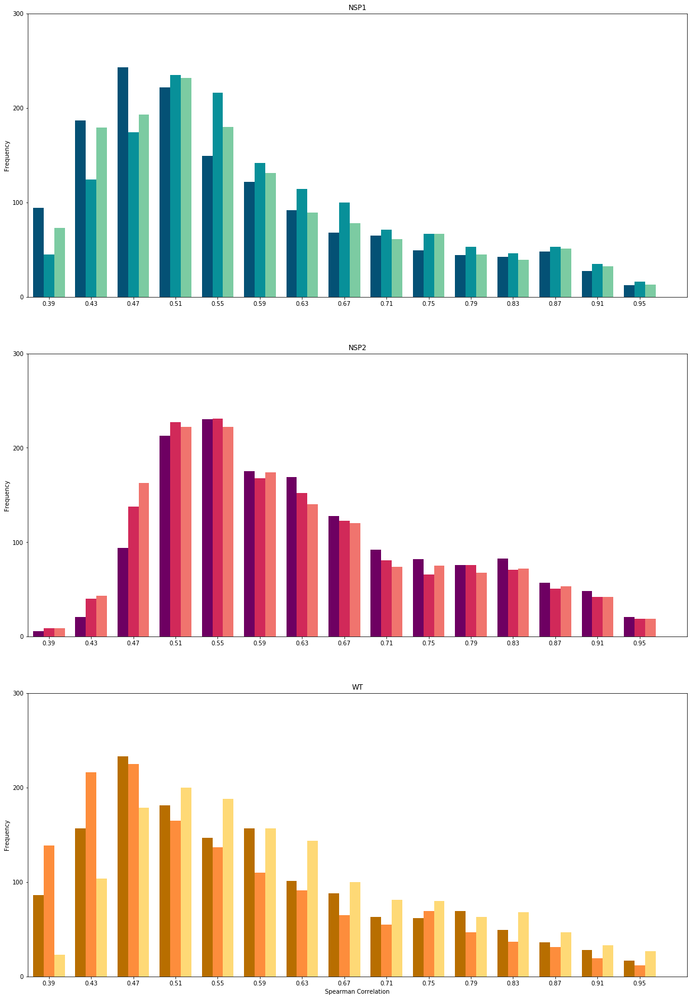

In [48]:
plt.rcParams['figure.figsize'] = [20, 30]
display_html("<center><b>Spearman Correlations by Condition</b></center>", raw = True)

#xmin = 0.2
ymax = 250

NSP1_colors = [EXPERIMENT_COLORS[e] for e in ["20200717-NSP1-HEK-1-setB", "20200717-NSP1-HEK-2-setB", "20200717-NSP1-HEK-3-setB"] ]
NSP2_colors = [EXPERIMENT_COLORS[e] for e in ["20200717-NSP2-HEK-1-setB", "20200717-NSP2-HEK-2-setB", "20200717-NSP2-HEK-3-setB"] ]
WT_colors   = [EXPERIMENT_COLORS[e] for e in ["20200717-WT-HEK-1-setB", "20200717-WT-HEK-2-setB", "20200717-WT-HEK-3-setB"] ]

plt.subplot(3,1,1)

plt.title("NSP1")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP1_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP1_colors, 
                             correlations   = spearman_correlations["NSP1"],
                             bin_edges      = bin_edges,
                             #number_of_bins = 20, 
                             bin_width      = bin_width)

plt.subplot(3,1,2)


plt.title("NSP2")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP2_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP2_colors, 
                             correlations   = spearman_correlations["NSP2"],
                             bin_edges      = bin_edges,
                             #number_of_bins = 20, 
                             bin_width      = bin_width)

plt.subplot(3,1,3)

plt.title("WT")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = WT_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = WT_colors, 
                             correlations   = spearman_correlations["WT"],
                             bin_edges      = bin_edges,
                             #number_of_bins = 20, 
                             bin_width      = bin_width)

plt.xlabel("Spearman Correlation");
plt.savefig("spearman_correlation_of_cds_coverages_padjusted.pdf");

**Note:** We decided not to include spearman correlation in the publication. We are only using pearson correlation in the manuscript.

## Sample Gene Coverages

In [28]:
myribo.print_info()

Ribo File Info:
---------------
Ribo File Version : 1.0
RiboPy Version    : 0.0.0
Creation Time     : 2020-07-20 23:53:05
Reference         : appris-v1
Min Read Length   : 15
Max Read Length   : 40
Metagene Radius   : 50
Left Span         : 35
Right Span        : 10

Experiments:
------------ 
Name                         Reads  Coverage  RNA-Seq  Metadata
20200618-NSP1-HEK-1        7075270         *        *          
20200618-NSP1-HEK-2        7954234         *        *          
20200618-NSP1-HEK-3        8631477         *        *          
20200618-NSP2-HEK-1        7319954         *        *          
20200618-NSP2-HEK-2       13871717         *        *          
20200618-NSP2-HEK-3        7436286         *        *          
20200717-NSP1-HEK-1-setB  12503413         *        *          
20200717-NSP1-HEK-2-setB  10390514         *        *          
20200717-NSP1-HEK-3-setB  16772718         *        *          
20200717-NSP2-HEK-1-setB  17989686         *        *          
2

### High Correlation Example

As the high correlation example, we pick RPL41 which has a correlation value of 0.93.

In [29]:
for gene, cor in pearson_correlations["NSP1"]['20200717-NSP1-HEK-1-setB_20200717-NSP1-HEK-3-setB'].items():
    cds_start = coverages['20200717-NSP1-HEK-3-setB'][0].loc[gene, "cds_start"]
    cds_stop = coverages['20200717-NSP1-HEK-3-setB'][0].loc[gene, "cds_stop"]
    cds_len = cds_stop - cds_start
    
    if cor >= 0.9:
        print(gene, cds_len, cor)

PPIA-204 495 0.9679887311507103
RPL26-209 435 0.9760529909014832
ATP5MF-203 264 0.9071716567898939
EIF5A-202 462 0.9524278148714126
HNRNPA1-203 960 0.9831955831606349
HIST1H2BC-201 378 0.9137062088976012
PGAM1-201 762 0.9098031629175782
TUBA1B-202 1353 0.962388578342276
ENO1-213 1302 0.9138983963901943
HSPE1-201 306 0.9522989140875725
HIST2H2BF-201 378 0.9587271212481231
NPM1-201 882 0.9742076217428716
HIST1H2BD-201 378 0.9307725173389076
HIST1H2AI-201 390 0.9244055272437356
RPS10-206 495 0.9724793829798511
HIST1H2BJ-203 378 0.9440700286237816
EEF1A1-202 1386 0.9189050131916662
HIST1H3B-201 408 0.9309631113760237
NACA-201 645 0.9022754466106586
UBB-201 687 0.9121583288217702
NDUFC2-201 357 0.902010829521749
RPL41-204 75 0.9129088179945882
RPS27A-201 468 0.9464824247409404
HIST1H2BK-201 378 0.9329873813384002
ACTG1-210 1125 0.911542876177736
RPL22-201 384 0.9567499330957168
HIST2H2BE-201 378 0.9291878007579905
HIST2H2AC-201 387 0.9011322630591739
HIST1H4J-201 309 0.9586624114750378
ACTB

In [30]:
plt.rcParams['figure.figsize'] = [20, 20]
this_gene       = "RPL41-204"
experiments     = ['20200717-NSP1-HEK-1-setB', '20200717-NSP1-HEK-3-setB'  ]
titles          = ["NSP1-1", "NSP1-3"] 


cds_start   = coverages[NSP1_experiments[0]][0].loc[this_gene, "cds_start"]
cds_stop    = coverages[NSP1_experiments[0]][0].loc[this_gene, "cds_stop"]

xrange      = tuple(range(cds_start, cds_stop))

coverage_colors = NSP1_colors[0], NSP1_colors[1]

plt.figure( 1, (20,20),dpi = FIGURE_RESOLUTION );

for i in range(2):
    this_experiment = experiments[i]
    
    plt.subplot(2,1,1 + i)
    plt.ylim(bottom = -0 , top = 1300)

    plt.plot(xrange, coverages[this_experiment][1][this_gene][cds_start:cds_stop], 
             color = coverage_colors[i],
             linewidth = 3)

    #plt.axvspan(pause_start , pause_stop, color='red', alpha=0.2);
    plt.ylabel("Number of Mapped Reads")
    plt.xlabel("Nucleotide Position")
    plt.yticks( (0, 400, 800, 1200), (0, 400, 800, 1200) )
    plt.title(this_gene + ", " + titles[i]);
    
#plt.savefig("rpl41_correlation.pdf")

### Medium Correlation Example

As the medium correlation example, we pciked SERP1 which has a correlation value of 0.6

In [31]:
for gene, cor in pearson_correlations["NSP1"]['20200717-NSP1-HEK-1-setB_20200717-NSP1-HEK-3-setB'].items():
    cds_start = coverages['20200717-NSP1-HEK-3-setB'][0].loc[gene, "cds_start"]
    cds_stop = coverages['20200717-NSP1-HEK-3-setB'][0].loc[gene, "cds_stop"]
    cds_len = cds_stop - cds_start
    
    if cor >= 0.58 and cor <= 0.63 and cds_len < 300:
        print(gene, cds_len, cor)

C4orf3-202 198 0.5901034408526155
NOP10-201 192 0.6040979928654016
GNG5-201 204 0.6162057230631701
MRPS21-201 261 0.6043015103439937
LSM8-201 288 0.597132640958486
ATOX1-207 204 0.5964378919994179
PET100-202 219 0.6179653725653881
TIMM8B-204 294 0.6088162491671758
TOMM5-201 153 0.6292390015999297
LSM5-208 273 0.5865145901853446
RPS27L-201 252 0.6295446802226827
TMSB4X-203 132 0.6017877863232907
NEDD8-201 243 0.6221028006451295
COPS9-205 171 0.582300118253936
PMAIP1-202 162 0.5908089033196434
TIMM13-201 285 0.5939403600834597


In [32]:
plt.rcParams['figure.figsize'] = [20, 20]
this_gene       = "SERP1-203"
experiments     = ['20200717-NSP1-HEK-1-setB', '20200717-NSP1-HEK-3-setB'  ]
titles          = ["NSP1-1", "NSP1-3"] 


cds_start   = coverages[NSP1_experiments[0]][0].loc[this_gene, "cds_start"]
cds_stop    = coverages[NSP1_experiments[0]][0].loc[this_gene, "cds_stop"]

xrange      = tuple(range(cds_start, cds_stop))

coverage_colors = NSP1_colors[0], NSP1_colors[1]

plt.figure( 1, (20,20),dpi = FIGURE_RESOLUTION );

for i in range(2):
    this_experiment = experiments[i]
    
    plt.subplot(2,1,1 + i)
    plt.ylim(bottom = -0 , top = 18)

    plt.plot(xrange, coverages[this_experiment][1][this_gene][cds_start:cds_stop], 
             color = coverage_colors[i],
             linewidth = 3)

    #plt.axvspan(pause_start , pause_stop, color='red', alpha=0.2);
    plt.ylabel("Number of Mapped Reads")
    plt.xlabel("Nucleotide Position")
    #plt.yticks( (0, 400, 800, 1200), (0, 400, 800, 1200) )
    plt.title(this_gene + ", " + titles[i]);
    
#plt.savefig("serp1_correlation.pdf")    

### Low Correlation Sample

As a low correlation sample, we pick the gene ANAPC11-211 with correlation of 0.43.

In [33]:
for gene, cor in pearson_correlations["NSP1"]['20200717-NSP1-HEK-1-setB_20200717-NSP1-HEK-3-setB'].items():
    cds_start = coverages['20200717-NSP1-HEK-3-setB'][0].loc[gene, "cds_start"]
    cds_stop = coverages['20200717-NSP1-HEK-3-setB'][0].loc[gene, "cds_stop"]
    cds_len = cds_stop - cds_start
    
    if  cor <= 0.45 :
        print(gene, cds_len, cor)

DCAF7-205 1026 0.434677467818222
ANAPC11-211 252 0.34111776543733024
SERPINF1-201 1254 0.4381238872523698
LY6E-207 393 0.4258013084789965
CRABP2-204 414 0.43504841125698224
EIF4A2-201 1221 0.44346268395539656
ABHD10-201 918 0.43609194845329585
ZCCHC12-201 1206 0.4145916663955078
ATF3-202 543 0.34778497788321844
MID1-201 2001 0.42205198049132464
COMMD4-201 597 0.4400316044884767
GNB4-201 1020 0.44839967000745035
EIF4EBP1-201 354 0.4453343150761667
ERO1A-201 1404 0.4346411683146834
RNF181-201 459 0.3971179444200882
HSPA13-201 1413 0.4299009325001319
ATP6V0E1-203 243 0.4335236059527384
DAP3-202 1194 0.4485503971632251


In [34]:
plt.rcParams['figure.figsize'] = [20, 20]
this_gene       = "ANAPC11-211"
experiments     = ['20200717-NSP1-HEK-1-setB', '20200717-NSP1-HEK-3-setB'  ]
titles          = ["NSP1-1", "NSP1-3"] 


cds_start   = coverages[NSP1_experiments[0]][0].loc[this_gene, "cds_start"]
cds_stop    = coverages[NSP1_experiments[0]][0].loc[this_gene, "cds_stop"]

xrange      = tuple(range(cds_start, cds_stop))

coverage_colors = NSP1_colors[0], NSP1_colors[1]

plt.figure( 1, (20,20),dpi = FIGURE_RESOLUTION );

for i in range(2):
    this_experiment = experiments[i]
    
    plt.subplot(2,1,1 + i)
    plt.ylim(bottom = -0 , top = 18)

    plt.plot(xrange, coverages[this_experiment][1][this_gene][cds_start:cds_stop], 
             color = coverage_colors[i],
             linewidth = 3)

    #plt.axvspan(pause_start , pause_stop, color='red', alpha=0.2);
    plt.ylabel("Number of Mapped Reads")
    plt.xlabel("Nucleotide Position")
    #plt.yticks( (0, 400, 800, 1200), (0, 400, 800, 1200) )
    plt.title(this_gene + ", " + titles[i]);
    
#plt.savefig("anapc11_correlation.pdf")

## Coverage and Read Length

We try to answer the following question:
For a given coverage threshold, how many genes are there on or above this threshold?

Recall that we compute the coverage density by summing up all reads mapping to the
CDS sequence of a gene. Then we divide that number by the length of the CDS. 
This gives us average number of reads per nucleotide position. We call this number coverage density.
So, for a given positive number x, we ask, "how many genes are there whose coverage density is at least x?".
We summarize the answer in the following grpah.

In [35]:
#coverages["20200618-NSP2-HEK-2"][0].sort_values(by = "norm_cds", ascending = False)

def find_coverage_counts(df):
    cds_densities       = np.divide(df["norm_cds"], 1) 
    coverage_thresholds = [0.5, 1, 2, 3, 4]
    counts              = []
    
    for T in coverage_thresholds:
        this_count = 0
        for x in cds_densities:
            if x > T:
                this_count += 1
        counts.append(this_count)
    return coverage_thresholds, counts

find_coverage_counts(coverages["20200618-NSP2-HEK-2"][0])

([0.5, 1, 2, 3, 4], [1819, 932, 395, 261, 197])

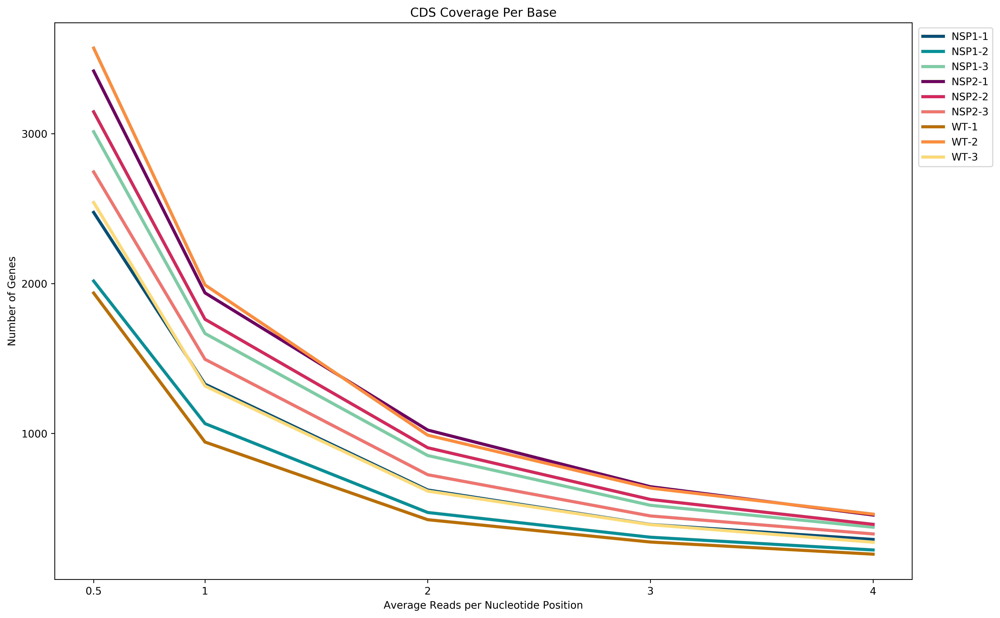

In [52]:
plt.rcParams['figure.figsize'] = [15, 10]

plt.figure( 1, (15,10),dpi = FIGURE_RESOLUTION );

experiment_set   = NSP1_experiments + NSP2_experiments + WT_experiments
experiment_names = ["NSP1-1", "NSP1-2", "NSP1-3",
                    "NSP2-1", "NSP2-2", "NSP2-3",
                    "WT-1",   "WT-2",   "WT-3"] 

plot_colors = NSP1_colors + NSP2_colors + WT_colors
plt.xticks( (0.5, 1, 2, 3, 4), (0.5, 1, 2, 3, 4))
plt.yticks( (1000, 2000, 3000), (1000, 2000, 3000) )

for i in range(len(experiment_set)):
    e = experiment_set[i]
    thresholds, counts = find_coverage_counts(coverages[e][0])
    
    plt.plot(thresholds, counts, 
             label     = e, 
             linewidth = 3,
             color     = plot_colors[i])
    

plt.legend(experiment_names, loc= "upper right",
           bbox_to_anchor=(1.1, 1));
plt.title("CDS Coverage Per Base")
plt.ylabel("Number of Genes")
plt.xlabel("Average Reads per Nucleotide Position")
plt.savefig("genes_vs_cds_coverage_density_p_adjusted.pdf")

**Figure**: Number of genes versus average CDS coverage per base. The x-axis  corresponds to the number of reads per nucleotide position. The y-axis shows the number of genes. A point (x, y) indicates that there are y genes having x or more average number of reads per nucleotide position. Only the reads on the coding region of the genes are take to calculate the averages. 

## Coverage Between NSP1 and NSP2

In [37]:


NSP1_vs_NSP2_pairs = (\
    ('20200717-NSP1-HEK-3-setB', '20200717-NSP2-HEK-1-setB'), 
    ('20200717-NSP1-HEK-3-setB', '20200717-NSP2-HEK-2-setB'), 
    ('20200717-NSP1-HEK-3-setB', '20200717-NSP2-HEK-3-setB')
)

NSP2_vs_NSP1_pairs = (\
    ('20200717-NSP2-HEK-3-setB', '20200717-NSP1-HEK-1-setB'), 
    ('20200717-NSP2-HEK-3-setB', '20200717-NSP1-HEK-2-setB'), 
    ('20200717-NSP2-HEK-3-setB', '20200717-NSP1-HEK-3-setB')
)

NSP1_vs_NSP2_pearson = \
        get_correlations(
                     coverages        = coverages, 
                     pairs            = NSP1_vs_NSP2_pairs,
                     genes            = selected_genes,
                     correlation_type = "pearson")

NSP2_vs_NSP1_pearson = \
        get_correlations(
                     coverages        = coverages, 
                     pairs            = NSP2_vs_NSP1_pairs,
                     genes            = selected_genes,
                     correlation_type = "pearson")

NSP1_vs_NSP2_spearman = \
        get_correlations(
                     coverages        = coverages, 
                     pairs            = NSP1_vs_NSP2_pairs,
                     genes            = selected_genes,
                     correlation_type = "spearman")

NSP2_vs_NSP1_spearman = \
        get_correlations(
                     coverages        = coverages, 
                     pairs            = NSP2_vs_NSP1_pairs,
                     genes            = selected_genes,
                     correlation_type = "spearman")

In [38]:
plt.rcParams['figure.figsize'] = [20, 40]
display_html("<center><b>Pearson Correlations of CDS coverages by Condition</b></center>", raw = True)

#xmin = 0.3
#ymax = 250

NSP1_colors = [EXPERIMENT_COLORS[e] for e in ["20200717-NSP1-HEK-1-setB", "20200717-NSP1-HEK-2-setB", "20200717-NSP1-HEK-3-setB"] ]
NSP2_colors = [EXPERIMENT_COLORS[e] for e in ["20200717-NSP2-HEK-1-setB", "20200717-NSP2-HEK-2-setB", "20200717-NSP2-HEK-3-setB"] ]
WT_colors   = [EXPERIMENT_COLORS[e] for e in ["20200717-WT-HEK-1-setB", "20200717-WT-HEK-2-setB", "20200717-WT-HEK-3-setB"] ]


plt.figure( 1, (20,40),dpi = FIGURE_RESOLUTION )

plt.subplot(4,1,1)

plt.title("NSP1")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP1_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP1_colors, 
                             correlations   = pearson_correlations["NSP1"],
                             #number_of_bins = 20,
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)

plt.subplot(4,1,2)

plt.title("NSP2-3 versus NSP1 All Replicates")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP2_vs_NSP1_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP1_colors, 
                             correlations   = NSP2_vs_NSP1_pearson,
                             #number_of_bins = 20, 
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)

plt.subplot(4,1,3)


plt.title("NSP2")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP2_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP2_colors, 
                             correlations   = pearson_correlations["NSP2"],
                             #number_of_bins = 20,
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)

plt.subplot(4,1,4)

plt.title("NSP1-3 vs NSP2 All Replicates")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP1_vs_NSP2_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP2_colors, 
                             correlations   = NSP1_vs_NSP2_pearson,
                             #number_of_bins = 20, 
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)

Pearson Correlations of CDS coverages by Condition

In [51]:
plt.rcParams['figure.figsize'] = [20, 20]
display_html("<center><b>Spearman Correlations of CDS coverages by Condition</b></center>", raw = True)

#xmin = 0.3
ymax = 250

NSP1_colors = [EXPERIMENT_COLORS[e] for e in ["20200717-NSP1-HEK-1-setB", "20200717-NSP1-HEK-2-setB", "20200717-NSP1-HEK-3-setB"] ]
NSP2_colors = [EXPERIMENT_COLORS[e] for e in ["20200717-NSP2-HEK-1-setB", "20200717-NSP2-HEK-2-setB", "20200717-NSP2-HEK-3-setB"] ]
WT_colors   = [EXPERIMENT_COLORS[e] for e in ["20200717-WT-HEK-1-setB", "20200717-WT-HEK-2-setB", "20200717-WT-HEK-3-setB"] ]


plt.figure( 1, (20,20),dpi = FIGURE_RESOLUTION )

plt.subplot(2,1,1)

plt.title("NSP1")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP1_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP1_colors, 
                             correlations   = spearman_correlations["NSP1"],
                             #number_of_bins = 20,
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)
"""
plt.subplot(4,1,2)

plt.title("NSP2-3 versus NSP1 All Replicates")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP2_vs_NSP1_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP1_colors, 
                             correlations   = NSP2_vs_NSP1_spearman,
                             #number_of_bins = 20, 
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)

plt.subplot(4,1,3)


plt.title("NSP2")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP2_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP2_colors, 
                             correlations   = spearman_correlations["NSP2"],
                             #number_of_bins = 20,
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)

"""
plt.subplot(2,1,2)

plt.title("NSP1-3 vs NSP2 All Replicates")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP1_vs_NSP2_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP2_colors, 
                             correlations   = NSP1_vs_NSP2_spearman,
                             #number_of_bins = 20, 
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)

plt.savefig("spearman_correlation_of_cds_accross_conditions_p_adjusted.pdf");

Spearman Correlations of CDS coverages by Condition

We should recall the sequencing depths and the fact that the correlation goes up with experiments having deeper sequencing. So, for a more fair comparison, we picked the 3rd replicate in NSP1-3 and all replicates of NSP2. Even though, NSP1-3 is a little deeper than 2 replicates of NSP2, it gave us a distribution barely shifted to the left.
Hence we conclude that global CDS coverages are highly conserved. 

Pearson Correlations of CDS coverages by Condition

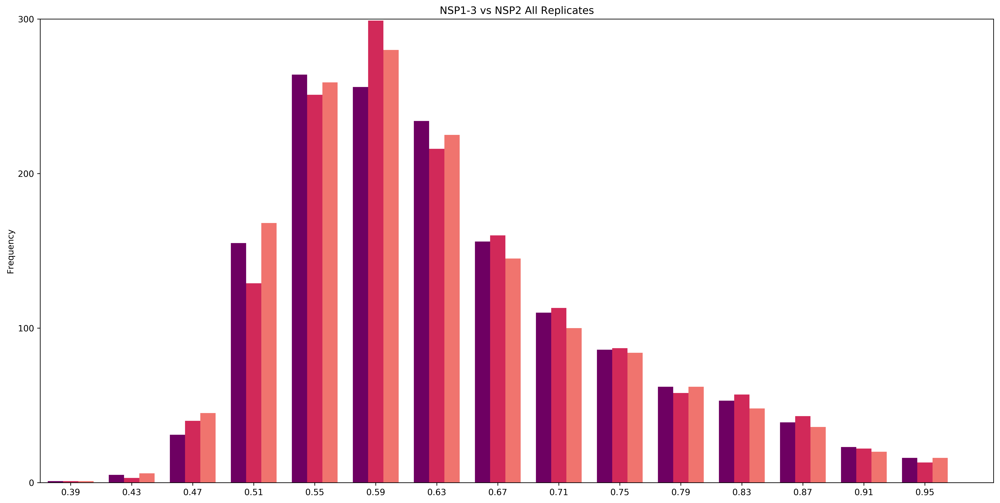

In [46]:
plt.rcParams['figure.figsize'] = [20, 10]
display_html("<center><b>Pearson Correlations of CDS coverages by Condition</b></center>", raw = True)

#xmin = 0.3
#ymax = 250


plt.figure( 1, (20,10),dpi = FIGURE_RESOLUTION )


plt.subplot(1,1,1)

plt.title("NSP1-3 vs NSP2 All Replicates")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP1_vs_NSP2_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP2_colors, 
                             correlations   = NSP1_vs_NSP2_pearson,
                             #number_of_bins = 20, 
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)

plt.savefig("pearson_NSP1_3_vs_NSP2_all_replicates_p_adjusted.pdf")

Spearman Correlations of CDS coverages by Condition

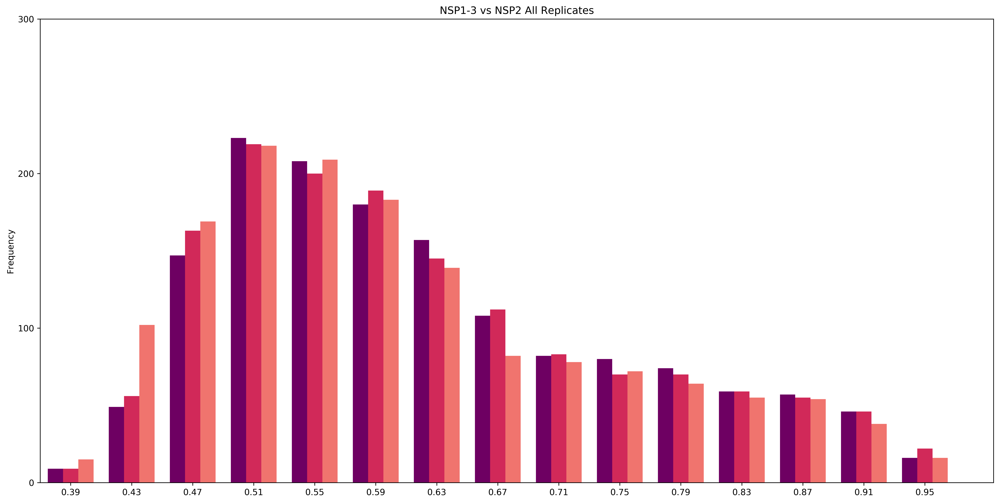

In [45]:
plt.rcParams['figure.figsize'] = [20, 10]
display_html("<center><b>Spearman Correlations of CDS coverages by Condition</b></center>", raw = True)

#xmin = 0.3
#ymax = 250


plt.figure( 1, (20,10),dpi = FIGURE_RESOLUTION )


plt.subplot(1,1,1)

plt.title("NSP1-3 vs NSP2 All Replicates")
plot_correlation_histograms( coverages      = coverages, 
                             pairs          = NSP1_vs_NSP2_pairs,
                             xmin           = xmin,
                             ymax           = ymax, 
                             colors         = NSP2_colors, 
                             correlations   = NSP1_vs_NSP2_spearman,
                             #number_of_bins = 20, 
                             bin_edges      = bin_edges,
                             bin_width      = bin_width)

plt.savefig("Spearman_NSP1_3_vs_NSP2_all_replicates_p_adjusted.pdf")

**Figure:** Histogram of spearman correlations between NSP1-3 and all replicates of NSP-3. We held NSP1-3 fixed and computed the gene coverage correlations between NSP1-3 and three replicates of NSP2. 

## Median and 90 percentile Pearson Correlations of NSP1

In [42]:
cor_array_NSP1_1_2    = tuple(pearson_correlations["NSP1"]["20200717-NSP1-HEK-1-setB_20200717-NSP1-HEK-2-setB"].values())
cor_array_NSP1_1_3    = tuple(pearson_correlations["NSP1"]["20200717-NSP1-HEK-1-setB_20200717-NSP1-HEK-3-setB"].values())
cor_array_NSP1_2_3    = tuple(pearson_correlations["NSP1"]["20200717-NSP1-HEK-2-setB_20200717-NSP1-HEK-3-setB"].values())
NSP1_combined_correls = sorted(cor_array_NSP1_1_2 + cor_array_NSP1_1_3 + cor_array_NSP1_2_3)

correlation_median_NSP1_1_2  = np.median( cor_array_NSP1_1_2 )
correlation_median_NSP1_1_3  = np.median( cor_array_NSP1_1_3 )
correlation_median_NSP1_2_3  = np.median( cor_array_NSP1_2_3 )
correlation_median_NSP1_comb = np.median(NSP1_combined_correls)

print("Median Pearson Correlations of NSP1 replicates:")
print("NSP1_1_2:      {}".format(correlation_median_NSP1_1_2))
print("NSP1_1_3:      {}".format(correlation_median_NSP1_1_3))
print("NSP1_2_3:      {}".format(correlation_median_NSP1_2_3))
print("---------------------")
print("NSP1 combined median: {}".format(correlation_median_NSP1_comb))
print("---------------------")


# Now we remove the lowest and highest 5 percent values
correlation_combined_size_NSP1 = len(NSP1_combined_correls)
lower_index = math.floor((correlation_combined_size_NSP1 / 100) * 5)
upper_index = math.ceil((correlation_combined_size_NSP1 / 100) * 95)
print("90% of the reads are in this interval:")
print("NSP1 90% min cor" , NSP1_combined_correls[lower_index])
print("NSP1 90% max cor" , NSP1_combined_correls[upper_index])

Median Pearson Correlations of NSP1 replicates:
NSP1_1_2:      0.5750110448163279
NSP1_1_3:      0.5987969797146935
NSP1_2_3:      0.5814906342633093
---------------------
NSP1 combined median: 0.5856675115029991
---------------------
90% of the reads are in this interval:
NSP1 90% min cor 0.46572786923742376
NSP1 90% max cor 0.84448821330712


In [43]:
NSP1_vs_NSP2_pearson.keys()

dict_keys(['20200717-NSP1-HEK-3-setB_20200717-NSP2-HEK-1-setB', '20200717-NSP1-HEK-3-setB_20200717-NSP2-HEK-2-setB', '20200717-NSP1-HEK-3-setB_20200717-NSP2-HEK-3-setB'])

In [44]:
cor_array_NSP1_NSP2_1    = tuple(NSP1_vs_NSP2_pearson["20200717-NSP1-HEK-3-setB_20200717-NSP2-HEK-1-setB"].values())
cor_array_NSP1_NSP2_2    = tuple(NSP1_vs_NSP2_pearson["20200717-NSP1-HEK-3-setB_20200717-NSP2-HEK-2-setB"].values())
cor_array_NSP1_NSP2_3    = tuple(NSP1_vs_NSP2_pearson["20200717-NSP1-HEK-3-setB_20200717-NSP2-HEK-3-setB"].values())

NSP1_NSP2_combined_correls = sorted( cor_array_NSP1_NSP2_1 + cor_array_NSP1_NSP2_2 + cor_array_NSP1_NSP2_3 )

correlation_median_NSP1_NSP2_1 = np.median( cor_array_NSP1_NSP2_1 )
correlation_median_NSP1_NSP2_2 = np.median( cor_array_NSP1_NSP2_2 )
correlation_median_NSP1_NSP2_3 = np.median( cor_array_NSP1_NSP2_3 )

correlation_median_NSP1_NSP2_comb = np.median(NSP1_NSP2_combined_correls)

print("Median Pearson Correlations of NSP1-3 vs NSP2 replicates:")
print("NSP1_NSP2_1:      {}".format(correlation_median_NSP1_NSP2_1))
print("NSP1_NSP2_2:      {}".format(correlation_median_NSP1_NSP2_2))
print("NSP1_NSP2_3:      {}".format(correlation_median_NSP1_NSP2_3))
print("---------------------")
print("NSP1 & NSP2 combined median: {}".format(correlation_median_NSP1_NSP2_comb))
print("---------------------")


# Now we remove the lowest and highest 5 percent values
correlation_combined_size_NSP1_NSP2 = len(NSP1_NSP2_combined_correls)
lower_index = math.floor((correlation_combined_size_NSP1_NSP2 / 100) * 5)
upper_index = math.ceil((correlation_combined_size_NSP1_NSP2 / 100) * 95)
print("90% of the reads are in this interval:")
print("NSP1 90% min cor" , NSP1_NSP2_combined_correls[lower_index])
print("NSP1 90% max cor" , NSP1_NSP2_combined_correls[upper_index])

Median Pearson Correlations of NSP1-3 vs NSP2 replicates:
NSP1_NSP2_1:      0.6204606983445617
NSP1_NSP2_2:      0.6202279866135137
NSP1_NSP2_3:      0.614088015043028
---------------------
NSP1 & NSP2 combined median: 0.617947155988974
---------------------
90% of the reads are in this interval:
NSP1 90% min cor 0.5070353185314143
NSP1 90% max cor 0.8638188798441048
